# Проектная работа: Рынок заведений общественного питания Москвы

### Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Описание данных

Файл moscow_places.csv:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽».
и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

**Цель работы:** презентация результатов исследования рынка Москвы, которые помогут в выборе места для открытия заведения общественного питания

**План работы:**
1. Изучение общей информации
2. Предварительная обработка данных
3. Анализ данных
4. Детализация исследования: открытие кофейни
5. Подготовка и оформление презентации

## 1. Загрузка данных и изучение общей информации

In [1]:
# импортирую необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
from plotly import graph_objects as go
import plotly.express as px
import folium
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
# делаю единый визуальный стиль и размер фигур дял проекта
import matplotlib
matplotlib.style.use('ggplot')
plt.rc('figure', figsize=(15, 6))

In [3]:
# считываю данные в переменную
try:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')
warnings.filterwarnings('ignore')

In [4]:
# первичное ознакомление с данными
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
print('Количество заведений представленых в файле:', data['name'].nunique(), 'шт.')

Количество заведений представленых в файле: 5614 шт.


In [6]:
# знакомлюсь с типами данных в столбцах и пропусками
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Столбцы:**
- `name`, `address` ,`category`, `district` — соответствуют типу данных object;
- `hours` — с типом данных object, но содержит временные промежутки в виде часов работы;
- `lat` и `lng` — с типом данных float64, содержит координаты;
- `rating` — имеет тип данных float64,  содержит данные об оценке;
- `price` — с типом данных object, содержит категориальные данные;
- `avg_bill` — строка, содержит тип данных object, так же содежит числовые значения тип integer;
- `middle_avg_bill` и `middle_coffee_cup` — тип данных float64, из-за того, что содержит пропуски, по факту в этом столбце значения типа integer;
- `chain` — с типом данных int64, соответсвует булевым значениям;
- `seats` — тип данных float64, з-за того, что содержит пропуски, по факту в этом столбце значения типа integer

После предварительной проверки данных необходимо будет выполнить следующие действия:
- проверить данные на наличие явных и неявных дубликатов;
- проверить пропуски, понять причины их возникновения и по возможности устранить;
- проверить соответствуют ли заведения сетевым или нет;
- создать дополнительные столбцы с названиями улиц и с обозначением того, работает ли заведение круглосуточно и ежедневно.

## 2. Предобработка данных

**Дубликаты.** Первым делом избавлюсь от дубликатов

In [7]:
# проверяю данные на наличие явных дубликатов
print('Количество дубликатов в файле:', data.duplicated().sum())

Количество дубликатов в файле: 0


In [8]:
# устраняю возможные неявные дубликаты
# привожу буквы в единый регистр
data['name'] = data['name'].str.lower()
# удаляю точку в конце слова
data['name'] = data['name'].str.replace('\\.', ' ')
# удаляю двойной пробел
data['name'] = data['name'].str.replace('  ', ' ')
# удаляю тройной пробел
data['name'] = data['name'].str.replace('   ', ' ')
# удаляю пробелы вокруг знака `&`
data['name'] = data['name'].str.replace(' & ', '&')
# удаляю пробелы вокруг дефиса
data['name'] = data['name'].str.replace(' - ', '-')
# проверяю как изменилось количество уникальных заведений
print('Количество уникальных заведений после обработки: ',data['name'].nunique())
print('Количество явных дубликатов после обработки: ', data.duplicated().sum())

Количество уникальных заведений после обработки:  5504
Количество явных дубликатов после обработки:  0


In [9]:
# проверка на неявные дубликаты в столбце district
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [10]:
# проверка на неявные дубликаты в столбце category
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

**Пропуски.** Для начала подробно разберем в каких столбцах пропуски, и проанализируем их взаимосвязь.

In [11]:
# проверяю относительное количество пропусков
pd.DataFrame(round((data.isna().mean()*100),2)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.380000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.560000
avg_bill,54.600000


Как видно, есть небольшие пропуски в столбце hours, около 40% пропусков в столбце seats, и большой блок пропусков в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup.

Столбец `hours` и `seats` - скорее всего данных на сайте нет, заполнить пропуски не представляется возможным.

Столбцы `middle_avg_bill` и `middle_coffee_cup` основываются на значениях столбца `avg_bill`, если в нем нет необходимых данных, то значения в столбцах нельзя заполнить.

Столбец `price` основывается на данных из столбца `middle_avg_bill`, можно расчитать по каким значениям распределялись категории и частично заполнить, но значения из этого столбца в исследовании не учавствуют, поэтому не вижу необходимости в его заполнении.

**Соответствие.** Проверю правильность распределения заведений на сетевые и не сетевые.

In [12]:
# разделяю заведения на сетевые и несетевые
chain_yes = data[data['chain'] == 1]
chain_no = data[data['chain'] == 0]
# смотрю пересекающиеся заведения
both_chain = set(chain_no['name']).intersection(set(chain_yes['name']))
print('Количество заведений, которые попали в обе категории:', len(both_chain))

Количество заведений, которые попали в обе категории: 40


Часть небольших сетевых заведений не перенесли в категорию сетевых, нужно это исправить.

In [13]:
# исправляем недочёт
for name in both_chain:
    for name_data in data['name']:
        if name == name_data:
            data.loc[data['name'] == name, 'chain'] = data.loc[data['name'] == name, 'chain'].replace(0, 1)


In [14]:
# теперь проверю заведения, которые находятся в категории сетевых, но таковыми не являются
chain_yes_error = (
    data.query('chain == 1')
    .groupby('name')
    .agg({'category' : 'count'})
    .reset_index().query('category < 2')
)

print('Количество заведений ошибочно занесенных в категорию сетевых: ',len(chain_yes_error))

Количество заведений ошибочно занесенных в категорию сетевых:  59


In [15]:
# исправляем категорию chain для 59 заведений
for name_chain in chain_yes_error['name']:
    for name_data in data['name']:
        if name_chain == name_data:
            data.loc[data['name'] == name_chain, 'chain'] = data.loc[data['name'] == name_chain, 'chain'] = 0          

**Добавление столбцов.** Необходимо добавить два столбца с названиями улиц и выделить заведения, которые работают ежедневно и круглосуточно.

In [16]:
# создаю функцию для разделения строки
def street_ext(value):
    ext_split = value.split(sep=', ')[1]
    return ext_split

In [17]:
# создаю столбец street с помощью функции
data['street'] = data['address'].apply(street_ext)

In [18]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [19]:
# создаю столбец с заведениями, которые работают ежедневно и круглосуточно
data_hours = data[data['hours'].notna()]
data['is_24/7'] = data_hours['hours'].str.contains('ежедневно, круглосуточно')
# в тех данных, в которых пропуски, по умолчанию укажу, что таковыми не являются
data['is_24/7'] = data['is_24/7'].fillna(False)

In [20]:
# проверяю резульат
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [21]:
# проверяю на наличие пропусков в созданных столбцах
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  street             8406 non-null   object 
 15  is_24/7            8406 non-null   bool   
dtypes: bool(1), float64(6), 

По итогам этого раздела была проделана следующая работа:
- Проверка на явные дубликаты не выявила проблем. С помощью приведения в нижний регистр названий зваедений, и замены некоторых символов, удалось частично решить проблему с неявными дубликатами в названиях, из-за ошибок при внесении в таблицу.
- После анализа пропущенных значений, пришёл к выводу,что корректно заменить пропуски не представляется возможным.
- Проверил, что заведения соответствуют своей сетевой категории. Исправил ошибки.
- Добавил два столбца для дальнейшего анализа : `street` (с названиями улиц) и `is_24/7` (с обозначением, что заведение работает ежедневно и круглосуточно)

## 3. Анализ данных

### 3.1. Анализ количества заведений по категориям

In [22]:
# проанализирую количество объектов общественного питания по категориям
data_category = data.groupby('category').agg({'name' : 'count'}).sort_values('name', ascending=False).reset_index()
display(data_category)

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


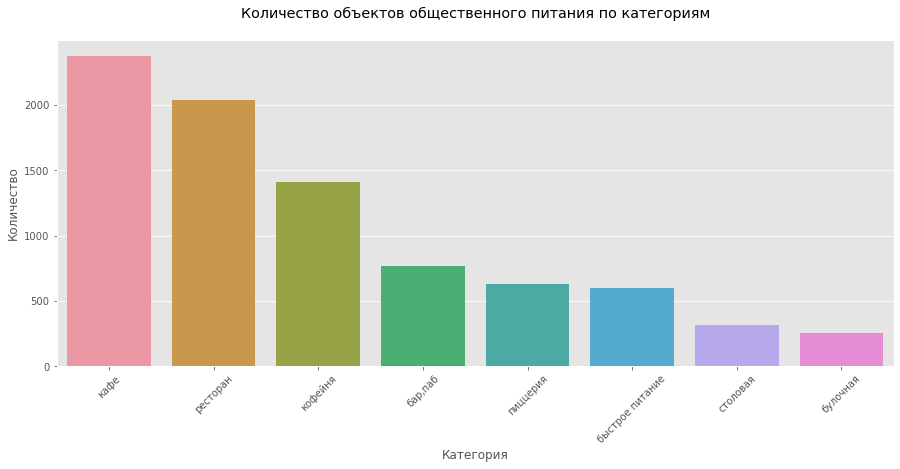

In [23]:
# соотношение заведений (в абсолютных значениях)
#with plt.style.context('ggplot'):
sns.barplot(data=data_category, x='category', y='name')
plt.title('Количество объектов общественного питания по категориям\n')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.xticks(rotation=45);

In [24]:
# соотношение заведений (в относительных значениях)
fig_category = go.Figure(data=[go.Pie(labels=data_category['category'], values=data_category['name'])])
fig_category.update_layout(
    title='Процентное соотношение количества заведений по категориям'
)
fig_category.show()

Из графиков следует, что около 50% от всего числа, занимают заведения с категориями "кафе" (28.3%) и "ресторан" (24.3%). На третьем месте расположились заведения категории "кофейня" (16.8%), все для любителей выпить кофе. 

### 3.2. Анализ количества посадочных мест в заведениях по категориям

In [25]:
# проанализирую количество посадочных мест в заведениях по категориям
data_seats = data.pivot_table(index='category', values='seats', aggfunc=['sum', 'median']).reset_index()
data_seats.columns=('Категория', 'Количество', 'Медиана')
display(data_seats)

,Категория,Количество,Медиана
0,"бар,паб",58281.0,82.5
1,булочная,13229.0,50.0
2,быстрое питание,34513.0,65.0
3,кафе,118770.0,60.0
4,кофейня,83511.0,80.0
5,пиццерия,40350.0,55.0
6,ресторан,154869.0,86.0
7,столовая,16359.0,75.5


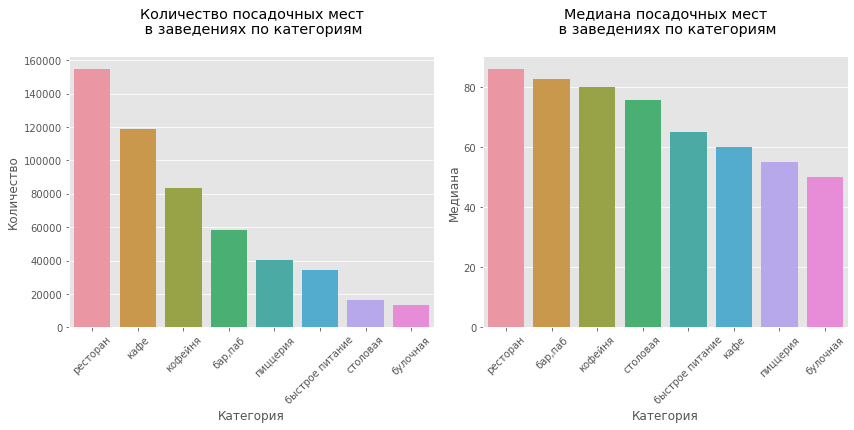

In [26]:
# соотношение количества посадочных мест
with plt.style.context('ggplot'):
    plt.figure(figsize=(12, 10))
    ax1 = plt.subplot(2, 2, 1)
    sns.barplot(data=data_seats.sort_values(by='Количество', ascending=False), x='Категория', y='Количество', ax=ax1)
    plt.title('Количество посадочных мест\n в заведениях по категориям\n')
    plt.xlabel('Категория')
    plt.ylabel('Количество')
    plt.xticks(rotation=45);
    ax2 = plt.subplot(2, 2, 2)
    sns.barplot(data=data_seats.sort_values(by='Медиана', ascending=False), x='Категория', y='Медиана', ax=ax2)
    plt.title('Медиана посадочных мест\n в заведениях по категориям\n')
    plt.xlabel('Категория')
    plt.ylabel('Медиана')
    plt.xticks(rotation=45);
    plt.tight_layout()

In [27]:
# соотношение количества посадочных мест (в относительных значениях)
fig_category = go.Figure(data=[go.Pie(labels=data_seats['Категория'], values=data_seats['Количество'])])
fig_category.update_layout(
    title='Процентное соотношение количества посадочных мест по категориям'
)
fig_category.show()

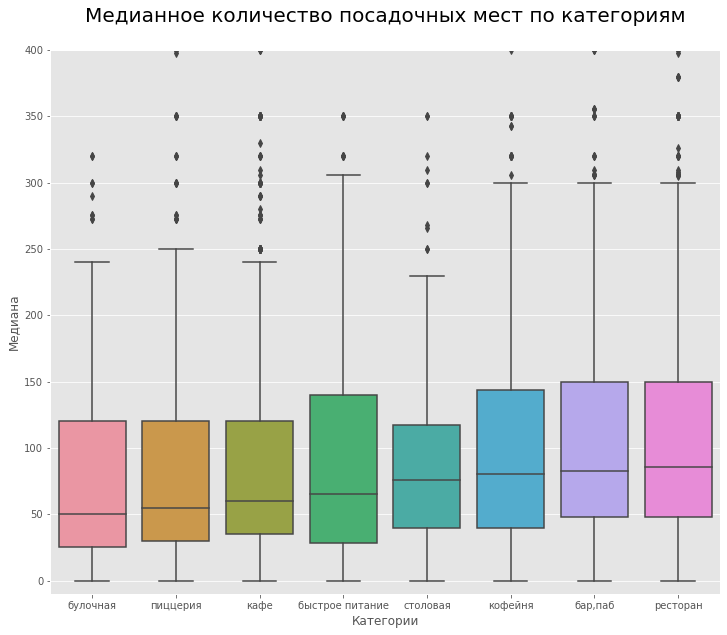

In [28]:
#with plt.style.context('ggplot'):
plt.figure(figsize=(12,10))
index_sort = data.groupby('category')['seats'].median().sort_values().index
sns.boxplot(data=data, x='category', y='seats', order=index_sort);
plt.ylim(-10, 400)
plt.title('Медианное количество посадочных мест по категориям\n', fontsize=20)
plt.xlabel('Категории')
plt.ylabel('Медиана');

Как видно количество посадочных мест приблизительно соответствует распределению заведений по категориям, за исключением того, что две категории поменялись местами.Так на первом месте теперь "рестораны" (29.8%), а на втором "кафе" (22.8%). Если судить по медиане, то посадочные места распределились таким образом:
 - 50-60 мест - Булочная, Пиццерия,Кафе;
 - 65-75 - Быстрое питание, Столовая;
 - 80-85 - Кофейня, Бар/Паб, Ресторан.

### 3.3. Анализ соотношения сетевых и несетевых заведений

In [29]:
# расчитываю соотношение сетевых и несетевых заведений
data_chain = data.groupby('chain').agg({'name' : 'count'}).reset_index()
data_chain = data_chain.replace({'chain' : {0 : 'Несетевое заведение', 1 : 'Сетевое заведение'}})
data_chain['percent'] = round(data_chain['name'] / len(data), 2)
display(data_chain)

,chain,name,percent
0,Несетевое заведение,5212,0.62
1,Сетевое заведение,3194,0.38


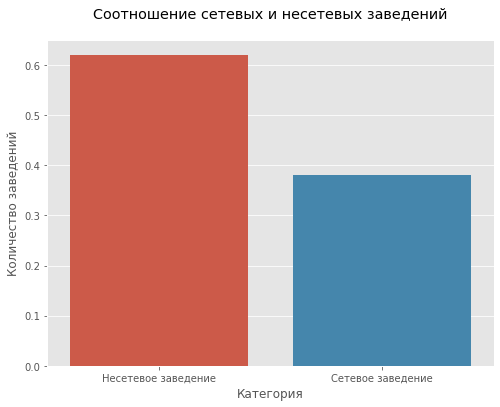

In [30]:
# строю график соотношения сетевых и несетевых заведений
plt.figure(figsize=(8, 6))
sns.barplot(data=data_chain, x='chain', y='percent')
plt.title('Соотношение сетевых и несетевых заведений\n')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=0);

Около 60% из представленных заведений являются несетевыми. 

### 3.4. Распределение  категорий  заведений по сетевым и несетевым

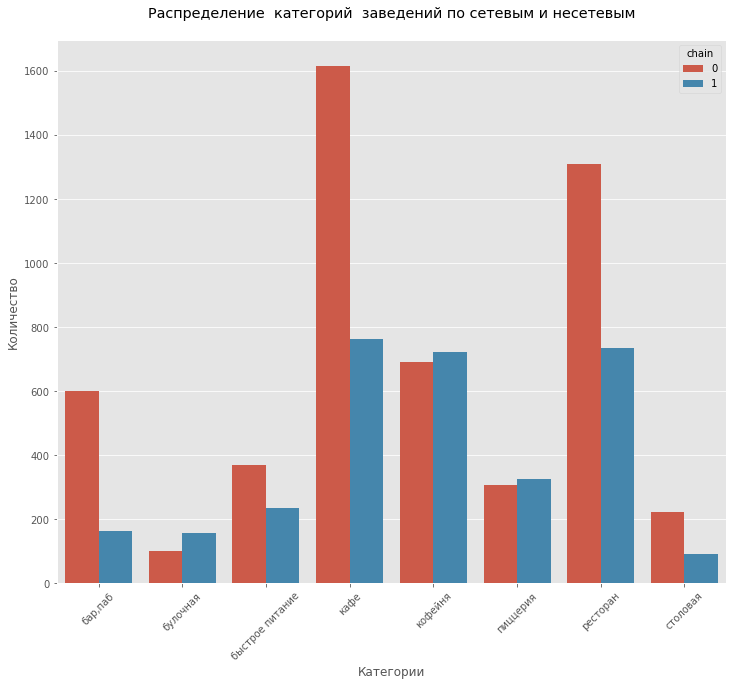

In [31]:
plt.figure(figsize=(12, 10))
chain_category = data.groupby(['category','chain']).agg({'name' : 'count'})
chain_category = chain_category.reset_index()
sns.barplot(data=chain_category, x='category', y='name', hue='chain')
plt.title('Распределение  категорий  заведений по сетевым и несетевым\n')
plt.xlabel('Категории')
plt.ylabel('Количество')
plt.xticks(rotation=45);

In [32]:
# расчитываю долю сетевых заведений от общего числа
check_ratio = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count').reset_index()
check_ratio['all']=check_ratio[0]+check_ratio[1]
check_ratio['ratio_1']=check_ratio[1]/check_ratio['all']
check_ratio = check_ratio.sort_values('ratio_1',ascending=False)
display(check_ratio)

chain,category,0,1,all,ratio_1
1,булочная,100,156,256,0.609375
5,пиццерия,307,326,633,0.515008
4,кофейня,691,722,1413,0.510970
2,быстрое питание,368,235,603,0.389718
6,ресторан,1308,735,2043,0.359765
3,кафе,1616,762,2378,0.320437
7,столовая,222,93,315,0.295238
0,"бар,паб",600,165,765,0.215686


In [33]:
fig_check_ratio=px.bar(y=check_ratio['ratio_1'], x=check_ratio['category'],
                       title='Доля сетевых заведений от общего числа',
                      labels={'y':'Доля', 'x':'Категория'},
                      text=check_ratio['ratio_1'].round(2))
fig_check_ratio.show()

График показывает, что хотя и с небольшим перевесом сетевыми заведениями чаще становятся кофейни, пиццерии и булочные.

### 3.5. Топ-15 популярных сетей в Москве

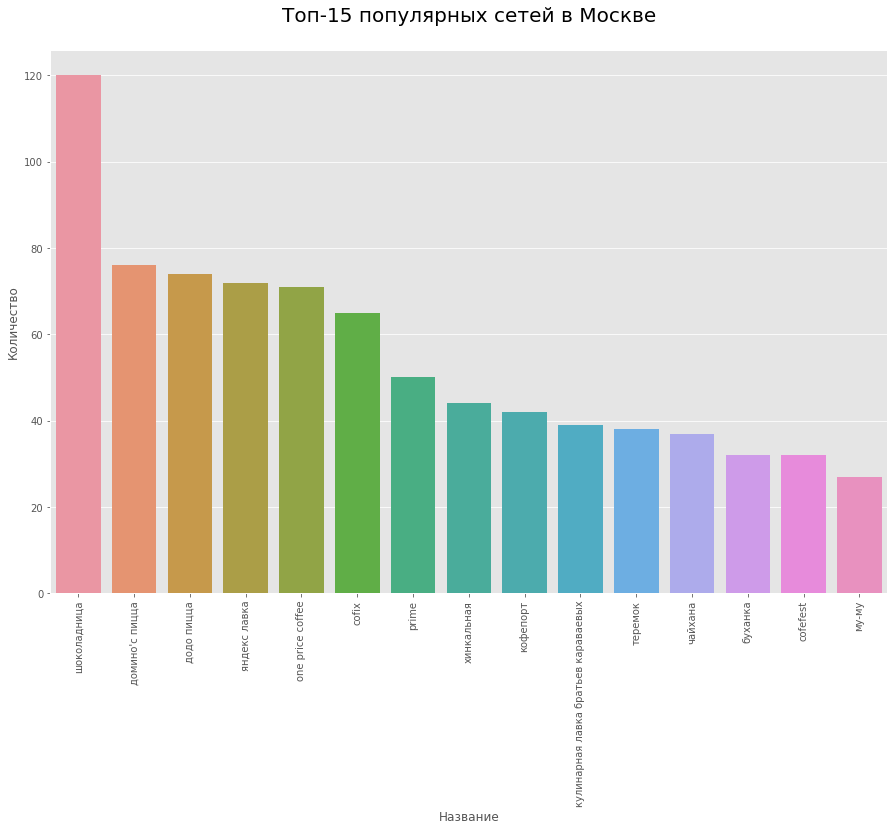

In [34]:
# выделяю топ-15 популярных сетей
chain_yes_fifth = (
    chain_yes.groupby('name')
    .agg({'district' : 'count'})
    .sort_values('district', ascending=False)
    .reset_index()
    .rename(columns={'name' : 'name', 'district' : 'cnt'})
    .head(15)
)

plt.figure(figsize=(15, 10))
sns.barplot(x=chain_yes_fifth['name'], y=chain_yes_fifth['cnt']);
plt.xticks(rotation=90)
plt.title('Топ-15 популярных сетей в Москве\n', fontsize=20)
plt.xlabel('Название')
plt.ylabel('Количество');

Из выделенных сетей все на слуху и хорошо знакомы. Отдельно стоит выделить огромное количество заведений в сети "Шоколадница".

In [35]:
# соединяю таблицы, чтобы получить более подробную информацию о каждой из сетей
chain_yes_fifth_merge = chain_yes.merge(chain_yes_fifth,on='name', how='inner')
display(chain_yes_fifth_merge.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,cnt
0,буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,32
1,буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,32
2,буханка,булочная,"Москва, Юрловский проезд, 14, корп. 3",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.879131,37.613068,4.3,NaN,NaN,NaN,NaN,1,NaN,32
3,буханка,булочная,"Москва, проезд Шокальского, 33",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.882732,37.648054,4.2,средние,Средний счёт:200–350 ₽,275.0,NaN,1,NaN,32
4,буханка,булочная,"Москва, Полярная улица, 27, корп. 2",Северо-Восточный административный округ,"ежедневно, 07:00–23:00",55.882158,37.636682,4.2,NaN,NaN,NaN,NaN,1,52.0,32


In [36]:
# распределение по категориям в топ-15 популярных сетей
chain_yes_fifth_merge.groupby('category').agg({'name':'count'}).sort_values('name', ascending=False)

,name
category,
кофейня,336
ресторан,189
пиццерия,151
кафе,100
булочная,25
быстрое питание,12
"бар,паб",4
столовая,2


Большинство заведений из топ-15 распределено в категориях "кофейня", "ресторан", "пиццерия" и "кафе".

In [37]:
# распределение категорий по округам в топ-15
chain_yes_fifth_merge_district = chain_yes_fifth_merge.pivot_table(index='district',
                                                                   columns='category',
                                                                   values='name',
                                                                   aggfunc='count')

display(chain_yes_fifth_merge_district)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,2.0,1.0,2.0,6.0,30.0,20.0,18.0,1.0
Западный административный округ,NaN,5.0,1.0,8.0,41.0,15.0,19.0,NaN
Северный административный округ,NaN,8.0,NaN,7.0,40.0,20.0,13.0,NaN
Северо-Восточный административный округ,NaN,6.0,2.0,6.0,37.0,19.0,15.0,NaN
Северо-Западный административный округ,NaN,3.0,2.0,1.0,20.0,13.0,8.0,NaN
Центральный административный округ,1.0,1.0,2.0,47.0,94.0,9.0,60.0,1.0
Юго-Восточный административный округ,NaN,NaN,2.0,12.0,15.0,16.0,11.0,NaN
Юго-Западный административный округ,1.0,1.0,1.0,9.0,25.0,16.0,17.0,NaN
Южный административный округ,NaN,NaN,NaN,4.0,34.0,23.0,28.0,NaN


In [38]:
chain_yes_fifth_merge_district_ratio = chain_yes_fifth_merge.pivot_table(index='category',
                                                                   columns='district',
                                                                   values='name',
                                                                   aggfunc='count')

for column in chain_yes_fifth_merge_district_ratio.columns:
    chain_yes_fifth_merge_district_ratio[column] = round((chain_yes_fifth_merge_district_ratio[column]/ chain_yes_fifth_merge_district_ratio[column].sum()) * 100, 2)
chain_yes_fifth_merge_district_ratio

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
category,,,,,,,,,
"бар,паб",2.50,NaN,NaN,NaN,NaN,0.47,NaN,1.43,NaN
булочная,1.25,5.62,9.09,7.06,6.38,0.47,NaN,1.43,NaN
быстрое питание,2.50,1.12,NaN,2.35,4.26,0.93,3.57,1.43,NaN
кафе,7.50,8.99,7.95,7.06,2.13,21.86,21.43,12.86,4.49
кофейня,37.50,46.07,45.45,43.53,42.55,43.72,26.79,35.71,38.20
пиццерия,25.00,16.85,22.73,22.35,27.66,4.19,28.57,22.86,25.84
ресторан,22.50,21.35,14.77,17.65,17.02,27.91,19.64,24.29,31.46
столовая,1.25,NaN,NaN,NaN,NaN,0.47,NaN,NaN,NaN


In [39]:
fig_district_ratio = px.bar(chain_yes_fifth_merge_district_ratio.T,
                            x=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия',
       'ресторан', 'столовая'],
                            barmode = 'stack', title='Доля распределения категорий заведений по округам',
                           labels={'district':'Округа', 'value':'Соотношение'})
fig_district_ratio.show()

In [40]:
# строю график для отображения взаимосвязей
fig_topfifth = px.bar(chain_yes_fifth_merge_district.reset_index(),
                      x="district", 
                      y=['бар,паб',
                         'булочная',
                         'быстрое питание',
                         'кафе',
                         'кофейня', 
                         'пиццерия',
                         'ресторан', 
                         'столовая'],
                      title="Карта распределения категорий топ-15 по округам",
                      labels={
                     "district": "Округа",
                     "value": "Количество"
                 }, width=900, height=700)
fig_topfifth.update_layout(xaxis={'categoryorder':'total descending'})

fig_topfifth.show()

По графику видно, что большая концентрация сетевых заведений в Центральном административном округе, в первую очередь кофеен, ресторанов и кафе. Меньше всего заведений из топ-15 в Северо-Западном административном округе.

### 3.6. Распределение заведений каждой категории по округам

In [41]:
data_district = data.pivot_table(index='district',
                                 columns='category',
                                 values='name',
                                 aggfunc='count')
display(data_district)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,239,150,71,218,24
Северный административный округ,68,39,58,235,193,77,189,41
Северо-Восточный административный округ,63,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


In [42]:
data_district_ratio= data.pivot_table(index='category',
                                 columns='district',
                                 values='name',
                                 aggfunc='count')
for column in data_district_ratio.columns:
    data_district_ratio[column]= round((data_district_ratio[column]/ data_district_ratio[column].sum()) * 100, 2)
data_district_ratio

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
category,,,,,,,,,
"бар,паб",6.64,5.88,7.56,7.07,5.62,16.24,5.32,5.36,7.62
булочная,3.13,4.35,4.33,3.14,2.93,2.23,1.82,3.81,2.80
быстрое питание,8.90,7.29,6.44,9.20,7.33,3.88,9.38,8.60,9.53
кафе,34.09,28.08,26.11,30.19,28.12,20.70,39.50,33.57,29.60
кофейня,13.16,17.63,21.44,17.85,15.16,19.09,12.46,13.54,14.69
пиццерия,9.02,8.34,8.56,7.63,9.78,5.04,7.70,9.03,8.18
ресторан,20.05,25.62,21.00,20.43,26.65,29.88,20.31,23.70,22.65
столовая,5.01,2.82,4.56,4.49,4.40,2.94,3.50,2.40,4.93


In [43]:
fig_data_district_ratio = px.bar(data_district_ratio.T, x=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия',
       'ресторан', 'столовая'],
                                 barmode = 'stack', 
                                 title='Распределение заведений каждой категории по округам',
                                labels={'district': 'Округа', 'value':'Соотношениея'})
fig_data_district_ratio.show()

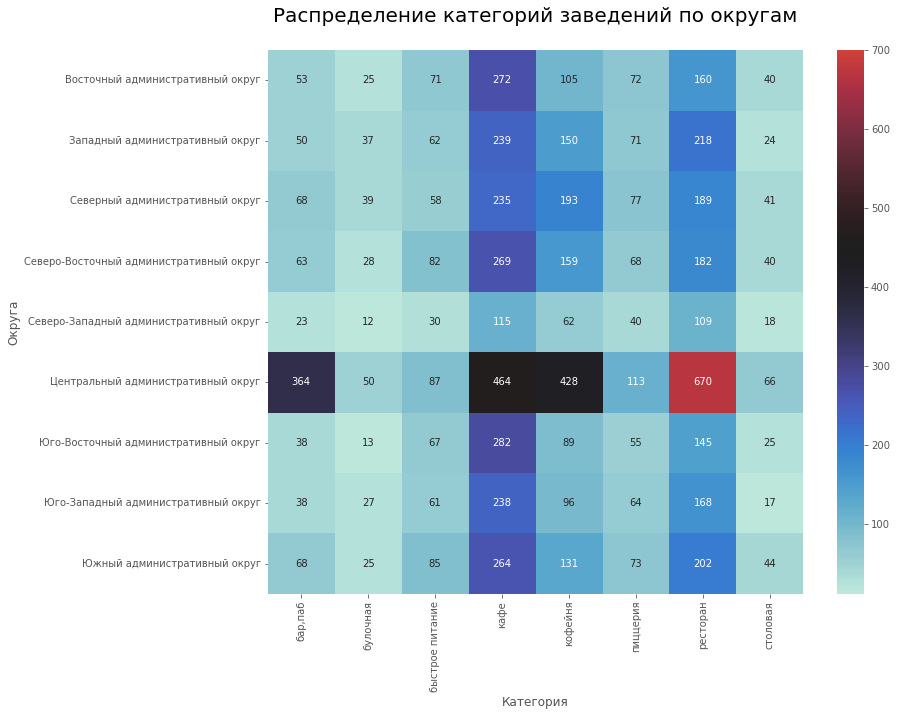

In [44]:
plt.figure(figsize=(12,10))
sns.heatmap(data_district, annot = True, fmt='.3g', vmin=12, vmax=700, center= 450);
plt.title('Распределение категорий заведений по округам\n', fontsize=20);
plt.xlabel('Категория')
plt.ylabel('Округа');

Большая концентрация завдений в Центральном административном округе, огромное количество ресторанов, а также много кофеен, кафе, баров и пабов(баров и пабов в Центральном округе приблизительно столько же, сколько в остальных округам вместе взятых).
Если не считать Центральный округ, кафе равномерно распределены по остальным округам, кроме Северо-Западного, который выделяется небольшим количеством всех категорий заведений.

### 3.7. Распределение средних рейтингов по категориям заведений

In [45]:
category_mean = (data.groupby('category')
                 .agg({'rating' : 'mean'})
                 .reset_index()
                 .rename(columns={'category' : 'Категория',
                                  'rating' : 'Рейтинг'})
                )
category_mean

,Категория,Рейтинг
0,"бар,паб",4.387712
1,булочная,4.268359
2,быстрое питание,4.050249
3,кафе,4.123886
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290357
7,столовая,4.211429


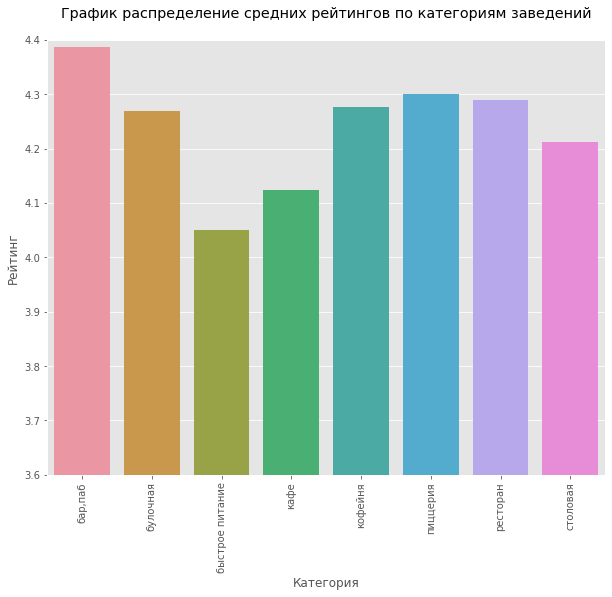

In [46]:
plt.figure(figsize=(10, 8))
sns.barplot(x=category_mean['Категория'], y=category_mean['Рейтинг'])
plt.title('График распределение средних рейтингов по категориям заведений\n')  
plt.ylim(3.6, 4.4)
plt.xticks(rotation=90);

Различие средних рейтингов по категориям заведений невелико, в диапазоне 4-4.4 пунктов. Самый низкий рейтинг у категории заведенйи "Быстрое питание" (4.05), а самый высокий у категории "Бар, паб" (4.38).

### 3.8. Картограмма со средним рейтингом заведений каждого района

In [47]:
# создаю табличку с распрделением среднего рейтинга по районам
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_data

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [48]:
# создаю карту распрделения среднего рейтинга по районам
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
geomap = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geomap,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Cредний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Наивысший рейтинг в Центральном административном округе, а самый низкий рейтинг в Юго-Восточн6ом административном округе.

### 3.9. Отображение всех заведений на карте в виде кластеров

In [49]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

На этой карте так же заметна концентрация заведений в Центральном административном округе. Заметна концентрация кофеен в ключевых точках, таких как станция метро или торговый центр.

### 3.10. Топ-15 улиц по количеству заведений

In [50]:
# выделяю топ-15 улиц
top_street = (data.groupby('street')
              .agg({'name':'count'})
              .reset_index()
              .rename(columns={'street':'street', 'name':'cnt_inst'})
              .sort_values('cnt_inst',ascending=False)
              .head(15)
             )
display(top_street)

,street,cnt_inst
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [51]:
ffff = list(top_street['street'])
top_data_2 = data.query('street in @ffff')
top_data_2

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
12,заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,МКАД,False
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
26,пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False
28,mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
8396,пекинский двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,Ленинский проспект,False
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True


In [52]:
# собираю общую таблицу топ-15 улиц
top_street_merge = data.merge(top_street, on='street', how='inner')
top_street_merge_pivot = top_street_merge.pivot_table(index='street', columns='category', values='name', aggfunc='count')
display(top_street_merge_pivot)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


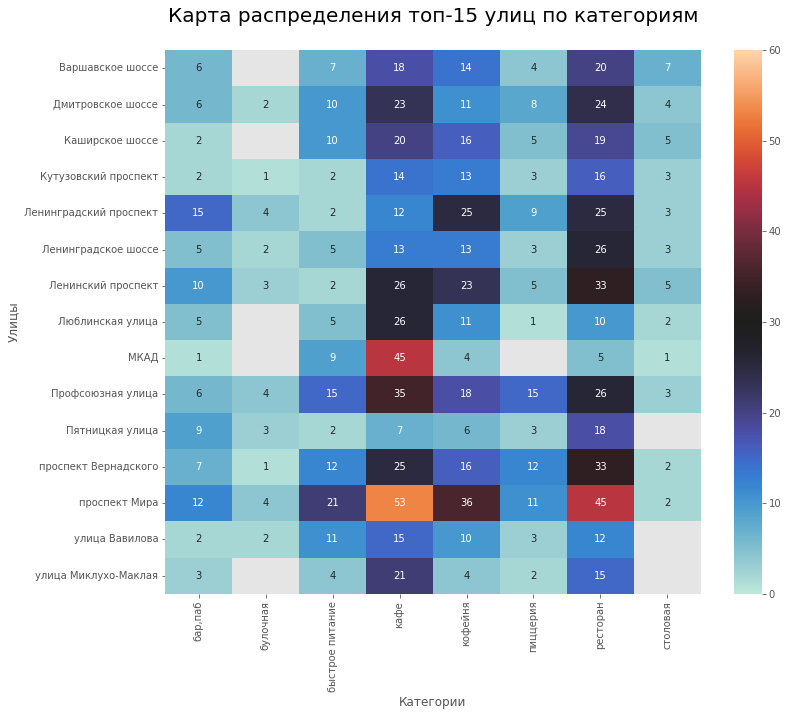

In [53]:
# тепловая карта распределения топ-15 улиц по категориям
plt.figure(figsize=(12,10))
sns.heatmap(top_street_merge_pivot, annot = True, fmt='.3g', vmin=0, vmax=60, center= 30);
plt.title('Карта распределения топ-15 улиц по категориям\n', fontsize=20)
plt.xlabel('Категории')
plt.ylabel('Улицы');

In [54]:
# Распределение топ-15 улиц по категориям
fig_topfifth_street = px.bar(top_street_merge_pivot.reset_index(),
                      x="street", 
                      y=['бар,паб',
                         'булочная',
                         'быстрое питание',
                         'кафе',
                         'кофейня', 
                         'пиццерия',
                         'ресторан', 
                         'столовая'],
                      labels={
                     "street": "Улицы",
                     "value": "Количество"},
                      title="Диаграмма распределения топ-15 улиц по категориям", width=1000, height=1000,
                            category_orders={"street":top_street['street']})

fig_topfifth_street.show()

Лидером по количеству заведений является проспект Мира. МКАД резко выделяется своим количеством кафе, которые сильно преобладают над остальными категориями заведений. Заметно, что топ-15 улиц приходится в основном на протяженные шоссе и проспекты.

### 3.11. Улицы с одним заведением общепита.

In [55]:
# формирую датасет с улицами,на которых одно заведение
street_alone = data.groupby('street').agg({'name':'count'}).query('name<2').reset_index()['street']
data_street_alone = data.query('street in @street_alone').reset_index()
display(data_street_alone.head())

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
1,21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
2,25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
3,58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
4,60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


In [56]:
# соотношение по сетевому признаку
data_street_alone_chain = data_street_alone.groupby('chain').agg({'name':'count'})
data_street_alone_chain

,name
chain,
0,323
1,135


In [57]:
# распрделение по категориям
data_street_alone_cat = data_street_alone.groupby('category').agg({'name':'count'})
data_street_alone_cat.sort_values('name', ascending=False)

,name
category,
кафе,160
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


In [58]:
# распределение по округам
data_street_alone_dist = data_street_alone.groupby('district').agg({'name':'count'})
data_street_alone_dist.sort_values('name', ascending=False)

,name
district,
Центральный административный округ,145
Северо-Восточный административный округ,55
Восточный административный округ,52
Северный административный округ,52
Южный административный округ,43
Юго-Восточный административный округ,39
Западный административный округ,35
Северо-Западный административный округ,19
Юго-Западный административный округ,18


In [59]:
# распределение по округам улиц с одной кофейней
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_street_alone.apply(create_clusters, axis=1)

# выводим карту
m

По поводу улиц, с одним заведением можно сказать следующее: здесь преобладают несетевые заведения, преимущественно это кафе, и больше всего их находится в Центральном округе. Такое количество заведений на одной улице прежде всего вызвано тем, что они находятся на очень коротких улочках и переулках, а так же ближе к окраинам, где концентрация заведений падает.

### 3.12. Средний чек

In [60]:
district_median = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
district_median.sort_values('middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [61]:
# создаю карту распределения медианного среднего чека заведений по районам
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
geomap = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geomap,
    data=district_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Средний чек выше в Центральном и Западном округах. В других округах, при удалении от центра средний чек падает, и в некоторых округах он в два раза ниже, чем в Центральном.

Опираясь на проведенные исследования про заведения в Москве можно сказать следующее:
- Больше всего заведений представлено такими категориями как кафе, рестораны и кофейни.
- Наибольшее количество посадочных мест так же представлено в категориях кафе, рестораны и кофейни и приблизительно соотносится с количеством заведений.
- 60% заведений в Москве являются несетевыми.
- Сетевыми чаще становятся кофейни, пиццерии и булочные. Кафе - чаще являются несетевыми.
- Топ-15 сетевых заведений пользуются широкой известностью, особое распространение получила сеть "Шоколадница".
- Наибольшая концентрация заведений в ЦАО, чаще всего это кофейни, кафе и рестораны.
- В целом средний рейтинг в зависимости от категории заведения не очень сильно отличается, самый высокий в категории "Бар, паб", а самый низкий в категории "Быстрое питание".
- Топ-15 улиц по количеству заведений находится на протяженных улицах,а так же на некоторых улицах в самом центре города.
- Самая высокий средний чек в ЦАО и в Западном округе. В других районах, подальше от центра, цена среднего чека уменьшается, и в некоторых районах в два раза ниже, чем в ЦАО.

## 4. Детализация исследования: открытие кофейни

In [62]:
# выделяю кофейни в таблице
data_coffee = data.query('category == "кофейня"')
print('Количество кофеен в датасете: ', len(data_coffee))

Количество кофеен в датасете:  1413


### 4.1. Распределение кофеен по округам

In [63]:
#смотрим распределение кофеен по округам
data_coffee_dist = data_coffee.groupby('district', as_index=False)['name'].agg('count')
data_coffee_dist.sort_values('name', ascending=False)

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [64]:
# визуальное распределение кофеен по округам
fig_data_coffee = px.bar(data_coffee_dist.reset_index().sort_values('name', ascending=False),
                         x="district",
                         y='name',
                         color="district",
                         title='Распределение кофеен по округам', 
                         labels={
                     "name": "Количество",
                     "district": "Округа"})
                        
                        
fig_data_coffee.show()

In [65]:
# распределение кофеен по округам на карте
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

# выводим карту
m

In [66]:
# количество сетевых и несетевых кофеен по округам
data_cnt_chain = data_coffee.pivot_table(index='district', columns='chain', values='name', aggfunc='count').reset_index()
data_cnt_chain.columns=('Округ', 'Несетевые', 'Сетевые')
display(data_cnt_chain)

,Округ,Несетевые,Сетевые
0,Восточный административный округ,53,52
1,Западный административный округ,58,92
2,Северный административный округ,95,98
3,Северо-Восточный административный округ,79,80
4,Северо-Западный административный округ,28,34
5,Центральный административный округ,206,222
6,Юго-Восточный административный округ,60,29
7,Юго-Западный административный округ,46,50
8,Южный административный округ,66,65


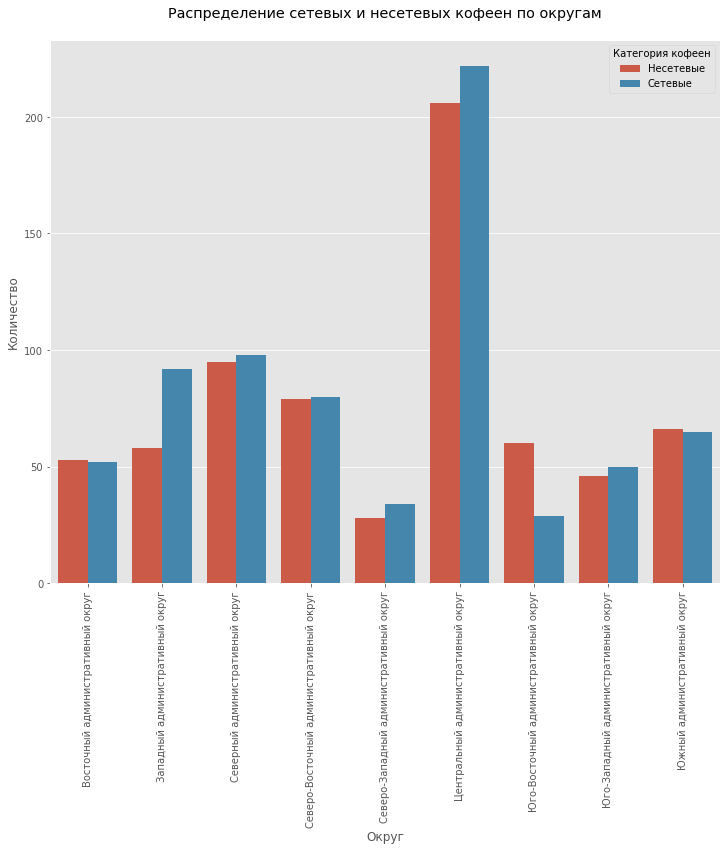

In [67]:
# посомтрим на диаграмме соотношение сетевых и несетевых кофеен
cnt_chain_vis = data_coffee.groupby(['district','chain']).agg({'name' : 'count'})
cnt_chain_vis = cnt_chain_vis.reset_index()
plt.figure(figsize=(12,10))
sns.barplot(data=cnt_chain_vis, x='district', y='name', hue='chain')  
plt.title('Распределение сетевых и несетевых кофеен по округам\n')
L=plt.legend(title='Категория кофеен')
L.get_texts()[0].set_text('Несетевые')
L.get_texts()[1].set_text('Сетевые')
plt.ylabel('Количество')
plt.xlabel('Округ')
plt.xticks(rotation=90);

### 4.2. Круглосуточный режим работы кофеен

In [68]:
# выделяю круглосуточные кофейни
print('Количество круглосуточных кофеен: ', len(data_coffee[data_coffee['is_24/7'] == True]))
print('Процент круглосуточных кофеен: {:.2%}'.format(len(data_coffee[data_coffee['is_24/7'] == True]) / len(data_coffee)))

Количество круглосуточных кофеен:  59
Процент круглосуточных кофеен: 4.18%


### 4.3. Рейтинг кофеен по округам

In [69]:
# смотрим на средний рейтинг кофеен по округам
data_coffee_rating = data_coffee.groupby('district',as_index=False)['rating'].agg('mean')
data_coffee_rating.sort_values('rating',ascending=False)

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


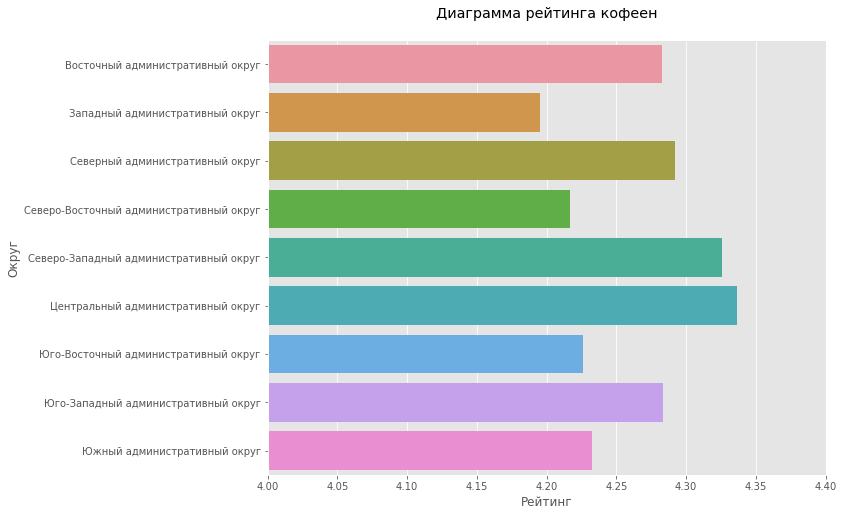

In [70]:
# строю диграмму рейтинга кофеен по округам
plt.figure(figsize=(10, 8))
sns.barplot(y=data_coffee_rating['district'], x=data_coffee_rating['rating'])
plt.xlim(4,4.4)
plt.title('Диаграмма рейтинга кофеен\n')
plt.xlabel('Рейтинг')
plt.ylabel('Округ');

In [71]:
# создаю карту распределения среднего рейтинга кофеен по районам
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
geomap = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geomap,
    data=data_coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

### 4.4. Стоимость чашки капучино

In [72]:
print('Медианная средняя стоимость чашки капучино: ', data_coffee['middle_coffee_cup'].median())

Медианная средняя стоимость чашки капучино:  170.0


In [73]:
# медианная средняя стоимость чашки капучино
data_coffee_cup = data_coffee.groupby('district',as_index=False)['middle_coffee_cup'].agg('median')
data_coffee_cup.sort_values('middle_coffee_cup',ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [74]:
# создаю карту распределения меданной средней стоимости чашки капучино по районам
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
geomap = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geomap,
    data=data_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная средняя стоимость чашки капучино',
).add_to(m)

# выводим карту
m

In [75]:
# соотношение сетевой и несетевой цен
coffee_cup_chain = data_coffee.pivot_table(index='district', 
                                           columns='chain', 
                                           values='middle_coffee_cup', 
                                           aggfunc='median').reset_index()
coffee_cup_chain.columns=('Округ', 'Несетевая цена', 'Сетевая цена')
coffee_cup_chain

,Округ,Несетевая цена,Сетевая цена
0,Восточный административный округ,135.0,120.0
1,Западный административный округ,167.5,225.0
2,Северный административный округ,165.0,140.0
3,Северо-Восточный административный округ,162.5,162.0
4,Северо-Западный административный округ,165.0,172.0
5,Центральный административный округ,195.0,180.0
6,Юго-Восточный административный округ,150.0,130.0
7,Юго-Западный административный округ,190.5,199.5
8,Южный административный округ,170.0,109.5


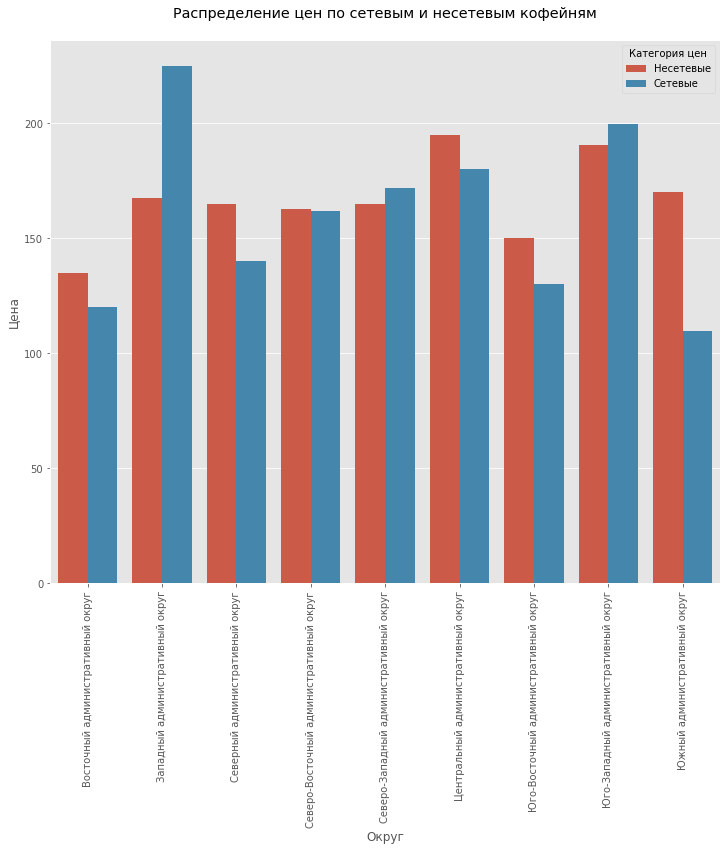

In [76]:
coffee_cup_chain_vis = data_coffee.groupby(['district','chain']).agg({'middle_coffee_cup' : 'median'})
coffee_cup_chain_vis = coffee_cup_chain_vis.reset_index()
plt.figure(figsize=(12,10))
sns.barplot(data=coffee_cup_chain_vis, x='district', y='middle_coffee_cup', hue='chain')  
plt.title('Распределение цен по сетевым и несетевым кофейням\n')
L=plt.legend(title='Категория цен')
L.get_texts()[0].set_text('Несетевые')
L.get_texts()[1].set_text('Сетевые')
plt.ylabel('Цена')
plt.xlabel('Округ')
plt.xticks(rotation=90);

### 4.5. Посадочные места в кофейнях

In [77]:
print('Медианное количество посадочных мест в кофейнях: ', data_coffee['seats'].median())

Медианное количество посадочных мест в кофейнях:  80.0


In [78]:
# медианное количество посадочных мест в кофейнях по округам
data_coffee_seats = data_coffee.groupby('district',as_index=False)['seats'].agg('median')
data_coffee_seats=data_coffee_seats.sort_values('seats',ascending=False)
display(data_coffee_seats)

,district,seats
1,Западный административный округ,96.0
4,Северо-Западный административный округ,87.5
5,Центральный административный округ,86.0
8,Южный административный округ,80.0
3,Северо-Восточный административный округ,75.0
2,Северный административный округ,66.0
7,Юго-Западный административный округ,64.5
0,Восточный административный округ,55.0
6,Юго-Восточный административный округ,50.0


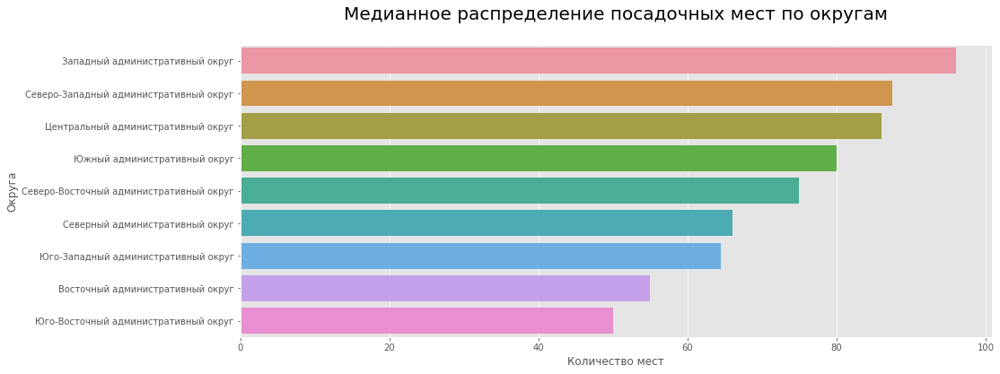

In [79]:
sns.barplot(y=data_coffee_seats['district'], x=data_coffee_seats['seats']);
plt.title('Медианное распределение посадочных мест по округам\n', fontsize=20)
plt.xlabel('Количество мест')
plt.ylabel('Округа');

In [80]:
# создаю карту распределения медианного количества посадочных мест в кофейнях по округам
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
geomap = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geomap,
    data=data_coffee_seats,
    columns=['district', 'seats'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное количество посадочных мест в кофейнях',
).add_to(m)

# выводим карту
m

In [81]:
# создаю карту распределения медианного количества посадочных мест в кофейнях по округам
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
geomap = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geomap,
    data=data_coffee_seats,
    columns=['district', 'seats'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное количество посадочных мест в кофейнях',
).add_to(m)

# выводим карту
m

Проанализировав данные вывел следующие промежуточные выводы:
- Расположить кофейню в округе, который ненасыщен кофейнями.
- Так как наша кофейня несетевая, то хотелось бы ее расположить в округе, где сетевые кофейни не преобладают.
- Желательно расположить кофейню в округе с не очень высокими рейтингами, людям не очень довольным качеством кофе/обслуживания проще будет сменить привычную кофейню, на новую (естественно при наличии необходимого качества), так как их меньше причин для удержания.
- Количество посадочных мест выберем согласно району расположения, этого будет и достаточно и не будет пустого зала, и согласно количеству посадочных мест, можно подобрать соответсвующее помещение.
- Карта с кластерами показывает, что кофейни чаще располагают в ключевых точках, например в районе метро или торгового центра.

Под вышеописанные параметры подходит Юго-Восточный Административный Округ:
- предпоследнее место по количеству кофеен;
- небольшое количество сетевых кофеен;
- один из самых низких рейтингов.

Загрузив карту с кластерами я отобрал следующее место с подходящими параметрами.

In [82]:
# присоединяю к таблице вероятное местоположение кофейни
data_coffee.loc[-1] = ['Shut up and Take',
                       'кофейня',
                       'Москва, улица Ташкентская, 10 к.1', 
                       'Юго-Восточный административный округ',
                       'ежедневно, 06:00-22:00',
                       55.70622, 37.81666,
                       '',
                       '',
                       '',
                       '',
                       150,
                       0,
                       50,
                       'улица Ташкентская',
                       False]
data_coffee.index = data_coffee.index + 1
data_coffee = data_coffee.sort_index()

In [83]:
# смотрим на карте с кластерам местоположение кофейни
shut_up_and_take_lat, shut_up_and_take_lng = 55.70622, 37.81666
m = Map(location=[shut_up_and_take_lat, shut_up_and_take_lng], zoom_start=16)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
data_coffee.apply(create_clusters, axis=1)
m


**Характеристики будущего места и будущей кофейни:**
- местоположение в районе, где почти нет кофеен, возле метро "Юго-Восточная", в шаговой доступности метро "Выхино", рядом так же находится кинотеатр "Волгоград" и небольшой сквер;
- время работы, с учетом местоположения возле метро, достаточно раннее с 6 утра, чтоб по пути на работу можно было взять кофе с собой, и до 22:00 для любителей посидеть с чашкой горячего напитка после работы;
- под кофейню будет необходимо небольшое помещение приблизительно на 50 посадочных мест, согласно потребностям для жителей данного района;
- средняя стоимость чашки капучино расположится на отметке в 150 руб., наравне с другими несетевыми кофейнями, и будет всего на 20 руб дороже,чем в сетевых согласно графику распределения цен по районам;


## 5. Подготовка презентации

Презентация: <https://www.dropbox.com/s/25fdo69psyquarg/open_coffee_point.pdf?dl=0>